In [1]:
import os
from dotenv import load_dotenv 
load_dotenv("../../constants/.env")

api_key = os.environ.get('BINANCE_KEY')
secret_key = os.environ.get('BINANCE_SECRET')

import time
from binance.client import Client
from binance.enums import *

# Configurações da API
API_KEY = api_key
API_SECRET = secret_key
client = Client(API_KEY, API_SECRET)


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [3]:
import plotly.graph_objects as go

def plot_closed_orders_with_icons(closed_orders_df, data, init, end):
    """
    Plota o gráfico de preços com ícones representando as operações de compra/venda (Lado)
    e os motivos (TP/SL).

    Parâmetros:
        closed_orders_df (pd.DataFrame): DataFrame com as colunas ['Lado', 'Preço Entrada', 'Resultado', 'Motivo', 'Index', 'Opened Index', 'reference_price'].
        data (pd.DataFrame): DataFrame com as colunas ['_id', 'timeframe', 'open', 'high', 'low', 'close', 'volume', 'timestamp'].
        init (int): Índice inicial do gráfico.
        end (int): Índice final do gráfico.
    """
    # Filtrar o DataFrame de preços para o intervalo especificado
    data_filtered = data.iloc[init:end]

    # Criar o gráfico de preços (close)
    fig = go.Figure()

    # Adicionar a linha do preço de fechamento
    fig.add_trace(go.Scatter(
        x=data_filtered['timeframe'],
        y=data_filtered['close'],
        mode='lines',
        name='Close Prices',
        line=dict(color='aqua', width=2)
    ))
    fig.add_trace(go.Scatter(
        x=data_filtered['timeframe'],
        y=data_filtered['high'],
        mode='lines',
        name='High Prices',
        line=dict(color='grey', width=2)
    ))
    fig.add_trace(go.Scatter(
        x=data_filtered['timeframe'],
        y=data_filtered['low'],
        mode='lines',
        name='Low Prices',
        line=dict(color='pink', width=2)
    ))

    # Adicionar ícones para operações
    for _, order in closed_orders_df.iterrows():
        index = order['Opened Index']
        
        # Verificar se o índice está dentro do intervalo
        if init <= index < end:
            timestamp = data.iloc[index]['timeframe']
            price = data.iloc[index]['close']
            lado = order['Lado']
            motivo = order['Motivo']

            # Escolher o símbolo e cor baseado no Lado e Motivo
            if lado == 'compra':
                symbol = 'triangle-up'
                color = 'green' if motivo == 'TP' else 'red'
            elif lado == 'venda':
                symbol = 'triangle-down'
                color = 'blue' if motivo == 'TP' else 'orange'
            else:
                continue  # Ignorar casos inesperados

            # Adicionar o marcador ao gráfico
            fig.add_trace(go.Scatter(
                x=[timestamp],
                y=[price],
                mode='markers',
                name=f'{lado.capitalize()} {motivo}',
                marker=dict(symbol=symbol, size=12, color=color),
                showlegend=False
            ))

    # Layout do gráfico
    fig.update_layout(
        title='Gráfico de Preços com Operações',
        xaxis_title='Timestamp',
        yaxis_title='Preço de Fechamento',
        template='plotly_white',
        height=600,
        legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01)
    )

    # Mostrar o gráfico
    fig.show()


In [4]:
from pymongo import MongoClient
import pandas as pd

# Carregar todos os dados da coleção
def load_data_from_mongodb(symbol):
    """
    Carrega todos os dados da coleção MongoDB e converte para um DataFrame do Pandas.

    Retorna:
        pd.DataFrame: DataFrame contendo os dados carregados.
    """
    # Configuração do MongoDB
    client_db = MongoClient("mongodb://localhost:27017/")  # Substitua pela URI do seu banco de dados
    db = client_db['trader_data']  # Nome do banco de dados
    collection = db[f'seconds_{symbol}']  # Nome da coleção
    

    # Consultar todos os documentos na coleção
    cursor = collection.find({})
    
    # Converter os documentos em uma lista de dicionários
    data_list = list(cursor)
    
    # Criar o DataFrame a partir da lista
    df = pd.DataFrame(data_list)

    # Garantir que os campos necessários estejam presentes
    # Ajuste conforme os campos reais na coleção
    required_columns = ['close', 'high', 'low','open', 'timeframe']
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"A coluna '{col}' está ausente no MongoDB.")

    # Converter a coluna de Timestamp para datetime, se necessário
    if 'timeframe' in df.columns and not pd.api.types.is_datetime64_any_dtype(df['timeframe']):
        df['timeframe'] = pd.to_datetime(df['timeframe'], unit='s')  # Ajuste 'unit' conforme necessário

    # Ordenar os dados por Timestamp para garantir consistência
    df = df.sort_values(by='timeframe').reset_index(drop=True)
    
    return df





In [5]:
def generate_report(closed_orders, open_orders, open_positions_history, amount_in_usd, symbol):
    """
    Gera um relatório detalhado com base nas ordens fechadas e abertas,
    incluindo gráfico de posições abertas ao longo do tempo.

    Parâmetros:
        closed_orders (list): Lista de ordens fechadas.
        open_orders (list): Lista de ordens abertas.
        open_positions_history (list): Histórico de posições abertas ao longo do tempo.
        amount_in_usd (float): Valor fixo em USD por operação.
        symbol (str): Símbolo do ativo negociado.
    
    Retorna:
        pd.DataFrame, dict: DataFrame de ordens fechadas e resumo geral do relatório.
    """
    
    # Converte as ordens fechadas para DataFrame
    closed_orders_df = pd.DataFrame(closed_orders, columns=["Lado", "Preço Entrada", "Resultado", "Motivo", "Index", "Opened Index", "Sl", "Tp"])
 
    # Converte as ordens abertas para DataFrame
    open_orders_df = pd.DataFrame(open_orders, columns=["Lado", "Preço Entrada", "TP", "SL", "Opened Index", "reference_price"])
    
    # Cálculo do resumo geral
    total_closed = len(closed_orders)  # Total de ordens fechadas
    total_open = len(open_orders)  # Total de ordens abertas
    total_profit = closed_orders_df[closed_orders_df["Resultado"] > 0]["Resultado"].sum()  # Total de lucros
    total_loss = closed_orders_df[closed_orders_df["Resultado"] < 0]["Resultado"].sum()  # Total de perdas
    net_profit = total_profit + total_loss  # Lucro líquido

    # Contagem de motivos
    tp_count = (closed_orders_df["Motivo"] == "TP").sum()
    sl_count = (closed_orders_df["Motivo"] == "SL").sum()
    
    # Resumo geral
    summary = {
        "Total de Ordens Fechadas": total_closed,
        "Total de Ordens Abertas": total_open,
        "Lucro Total (Fechadas)": total_profit,
        "Perdas Totais (Fechadas)": total_loss,
        "Lucro Líquido (Fechadas)": net_profit,
        "Ordens Fechadas por TP": tp_count,
        "Ordens Fechadas por SL": sl_count
    }
    
    # Exibição do resumo
    print("\nResumo Geral:")
    for key, value in summary.items():
        print(f"{key}: {value}")
    
    # # Exibição do gráfico
    # plt.figure(figsize=(10, 6))
    # plt.plot(open_positions_history, label="Posições Abertas")
    # plt.title("Evolução das Posições Abertas ao Longo do Tempo")
    # plt.xlabel("Tempo")
    # plt.ylabel("Número de Posições Abertas")
    # plt.legend()
    # plt.grid(True)
    # plt.show()

    return closed_orders_df, open_orders_df, summary


In [6]:
# Funções auxiliares
def simulate_strategy(data, tp, sl, movimentation, grid, time_in_seconds):
    """
    Simula a estratégia de grid trading baseada em movimentações de preço acumuladas em um intervalo de tempo.

    Parâmetros:
        data (pd.DataFrame): DataFrame contendo as colunas 'Close', 'High', 'Low', e 'Timestamp'.
        tp (float): Percentual de Take Profit (exemplo: 0.01 para 1%).
        sl (float): Percentual de Stop Loss (exemplo: 0.005 para 0.5%).
        grid (float): Percentual que define a distância entre os níveis de abertura.
        time_in_seconds (float): Intervalo de tempo, em segundos, para calcular a movimentação.

    Retorna:
        (list, list, list): Ordens fechadas, ordens abertas e histórico de posições abertas ao longo do tempo.
    """
    close_prices = data['close'].values
    high_prices = data['high'].values
    low_prices = data['low'].values
    timestamps = data['timeframe'].values
    
    n = len(close_prices)
    
    # Inicialização
    open_orders = []  # Formato: [("compra/venda", preço_entrada, TP, SL)]
    closed_orders = []  # Formato: [("compra/venda", preço_entrada, resultado, motivo)]
    open_positions_history = []  # Histórico de posições abertas
    
    time_threshold = np.timedelta64(int(time_in_seconds * 1e9), 'ns')
    
    def find_reference_price(current_time, index):
        """
        Encontra o preço de referência baseado no intervalo de tempo.
        Retorna o preço de fechamento que maximiza ou minimiza a movimentação dentro do intervalo.
    
        Parâmetros:
            current_time (int): Timestamp do candle atual.
            index (int): Índice do candle atual no DataFrame.
    
        Retorna:
            float: Preço de fechamento que maximiza/minimiza a movimentação percentual.
        """
        time_accumulated = 0
        max_price = None  # Para armazenar o maior preço no intervalo
        min_price = None  # Para armazenar o menor preço no intervalo
    
        for i in range(index, -1, -1):  # Itera para trás no tempo
            time_accumulated = current_time - timestamps[i]
            if max_price is None or high_prices[i] > max_price:
                max_price = high_prices[i]  # Atualiza o maior preço encontrado
            if min_price is None or low_prices[i] < min_price:
                min_price = low_prices[i]  # Atualiza o menor preço encontrado
    
            # Quando o tempo acumulado ultrapassa o limite
            if time_accumulated >= time_threshold:
                # Retorna o valor mais extremo (max ou min)
                if abs(max_price / close_prices[index] - 1) > abs(min_price / close_prices[index] - 1):
                    return max_price  # Retorna o maior preço se maximizar a movimentação
                else:
                    return min_price  # Retorna o menor preço se maximizar a movimentação
    
        # Caso não seja encontrado um intervalo válido, retorna o preço mais próximo
        return close_prices[0]


    
    def update_orders(open_orders, current_price, i, high_price, low_price):
        """Atualiza as ordens abertas e fecha as que atingiram TP ou SL."""
        remaining_orders = []
        for order in open_orders:
            side, entry_price, tp_price, sl_price, opened_index, reference_price = order
            if side == "compra":
                if low_price <= sl_price:
                    # Calcular retorno percentual
                    percentual_return = ((sl_price - entry_price) / entry_price) * 100
                    closed_orders.append((side, entry_price, percentual_return, "SL", i, opened_index, sl_price, tp_price))
                elif high_price >= tp_price:
                    # Calcular retorno percentual
                    percentual_return = ((tp_price - entry_price) / entry_price) * 100
                    closed_orders.append((side, entry_price, percentual_return, "TP", i, opened_index, sl_price, tp_price))
                
                else:
                    remaining_orders.append(order)
            elif side == "venda":
                if high_price >= sl_price:
                    # Calcular retorno percentual
                    percentual_return = ((entry_price - sl_price) / entry_price) * 100
                    closed_orders.append((side, entry_price, percentual_return, "SL", i, opened_index, sl_price, tp_price))
                elif low_price <= tp_price:
                    # Calcular retorno percentual
                    percentual_return = ((entry_price - tp_price) / entry_price) * 100
                    closed_orders.append((side, entry_price, percentual_return, "TP", i, opened_index, sl_price, tp_price))
                
                else:
                    remaining_orders.append(order)
        return remaining_orders

    
    def open_new_orders(current_price, side, i, reference_price):
        """Abre novas ordens de compra e venda em torno do preço atual."""

        if side == 'compra':
            buy_order = ("compra", current_price, current_price * (1 + tp), current_price * (1 - sl), i, reference_price)
            open_orders.append(buy_order)
        else:
            sell_order = ("venda", current_price, current_price * (1 - tp), current_price * (1 + sl), i, reference_price)
            open_orders.append(sell_order)

        return False

    # Tamanho "absoluto" do grid para outras validações
    initial_price = close_prices[0]
    last_opened_price = 0.00001
    movimentation_flag = False

    # Simulação
    for i in range(n):
        current_price = close_prices[i]
        high_price = high_prices[i]
        low_price = low_prices[i]
        current_time = timestamps[i]

        # 1) Primeiro, atualizar ordens existentes (TP / SL)
        open_orders = update_orders(open_orders, current_price, i, high_price, low_price)

        
        # Verifica se o preço se movimentou o suficiente desde a ultima abertura de operação
        if abs((last_opened_price-current_price)/last_opened_price) > grid:

            # 2) Encontrar o preço de referência baseado no intervalo de tempo
            reference_price = find_reference_price(current_time, i)
    
            # 3) Checar se houve movimentação forte
            mov = reference_price / current_price - 1
            if not movimentation_flag and len(open_orders) == 0 and abs(mov) >= movimentation:
                movimentation_flag = True
                # side = 'compra' if mov > 0 else 'venda' # reversão
                side = 'venda' if movimentation > 0 else 'compra' # tendencia
                
            # 4) Abrir novas ordens se necessário
            if len(open_orders) == 0 and movimentation_flag:
                open_new_orders(current_price, side, i, reference_price)
                movimentation_flag = False
                last_opened_price = current_price

        # 5) Registrar o número de posições abertas no momento
        open_positions_history.append(len(open_orders))
        
    return closed_orders, open_orders, open_positions_history
    


In [27]:
# Carregar os dados
symbol = "ACHUSDT"

granularity = "1m"
data = load_data_from_mongodb(symbol)

In [28]:
time_threshold = np.timedelta64(int(60 * 1e9), 'ns')
timestamps2 = data['timeframe'].values
time_accumulated = timestamps2[-1] - timestamps2[-5]
time_accumulated, time_threshold, timestamps2[-1]

(np.timedelta64(50000000000,'ns'),
 np.timedelta64(60000000000,'ns'),
 np.datetime64('2024-12-01T04:03:50.000000000'))

In [29]:
# Define o intervalo válido de tempo para análise
start_time = timestamps2[-1] - time_threshold
start_time

np.datetime64('2024-12-01T04:02:50.000000000')

In [30]:
valid_range = (timestamps2 >= start_time) & (timestamps2 <= timestamps2[-1])
valid_range[-20:]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True])

In [31]:
timestamps2[-20:]

array(['2024-12-01T04:01:28.000000000', '2024-12-01T04:01:38.000000000',
       '2024-12-01T04:01:40.000000000', '2024-12-01T04:01:56.000000000',
       '2024-12-01T04:01:58.000000000', '2024-12-01T04:02:02.000000000',
       '2024-12-01T04:02:06.000000000', '2024-12-01T04:02:08.000000000',
       '2024-12-01T04:02:14.000000000', '2024-12-01T04:02:16.000000000',
       '2024-12-01T04:02:32.000000000', '2024-12-01T04:02:34.000000000',
       '2024-12-01T04:02:44.000000000', '2024-12-01T04:02:52.000000000',
       '2024-12-01T04:02:54.000000000', '2024-12-01T04:03:00.000000000',
       '2024-12-01T04:03:04.000000000', '2024-12-01T04:03:20.000000000',
       '2024-12-01T04:03:26.000000000', '2024-12-01T04:03:50.000000000'],
      dtype='datetime64[ns]')

In [32]:
close_prices2 = data['close'].values
max_price = close_prices2[valid_range].max()
max_price

np.float64(0.03069)

In [33]:
close_prices2 = data['close'].values
min_price = close_prices2[valid_range].min()
min_price

np.float64(0.03067)

In [34]:
max_ = abs(max_price / close_prices2[-1] - 1)
min_ = abs(min_price / close_prices2[-1] - 1)
max_, min_

(np.float64(0.0006521030322790278), np.float64(0.0))

In [39]:
%%time 

grid = 0.01 # Movimento desde e o ultima operação
movimentation = 0.02 # movimentation de 2%
tp = 0.005  # Take Profit de 2.5%
sl = 0.005  # Stop Loss de 0.01%
amount_in_usd = 10
time_in_seconds = 60

print(symbol)

# data = pd.read_pickle(f"{symbol}_{granularity}.pkl")
data_filtered = data[data['timeframe'] >= '2023-01-01 00:00:00']

closed_orders, open_orders, open_positions_history = simulate_strategy(data_filtered, tp, sl, movimentation, grid, time_in_seconds)
closed_orders_df, open_orders_df, summary = generate_report(closed_orders, open_orders, open_positions_history, amount_in_usd, symbol)


ACHUSDT

Resumo Geral:
Total de Ordens Fechadas: 631
Total de Ordens Abertas: 0
Lucro Total (Fechadas): 167.50000000000017
Perdas Totais (Fechadas): -147.99999999999682
Lucro Líquido (Fechadas): 19.500000000003354
Ordens Fechadas por TP: 335
Ordens Fechadas por SL: 296
CPU times: user 1min 18s, sys: 20.9 ms, total: 1min 18s
Wall time: 1min 18s


In [29]:
# VIDTUSDT

# Resumo Geral:
# Total de Ordens Fechadas: 6445
# Total de Ordens Abertas: 0
# Lucro Total (Fechadas): 2820.0000000000027
# Perdas Totais (Fechadas): -1007.0000000000011
# Lucro Líquido (Fechadas): 1813.0000000000016
# Ordens Fechadas por TP: 1410
# Ordens Fechadas por SL: 5035
# CPU times: user 1min 6s, sys: 24.9 ms, total: 1min 6s
# Wall time: 1min 7s

In [30]:
# closed_orders_df.iloc[0:30]

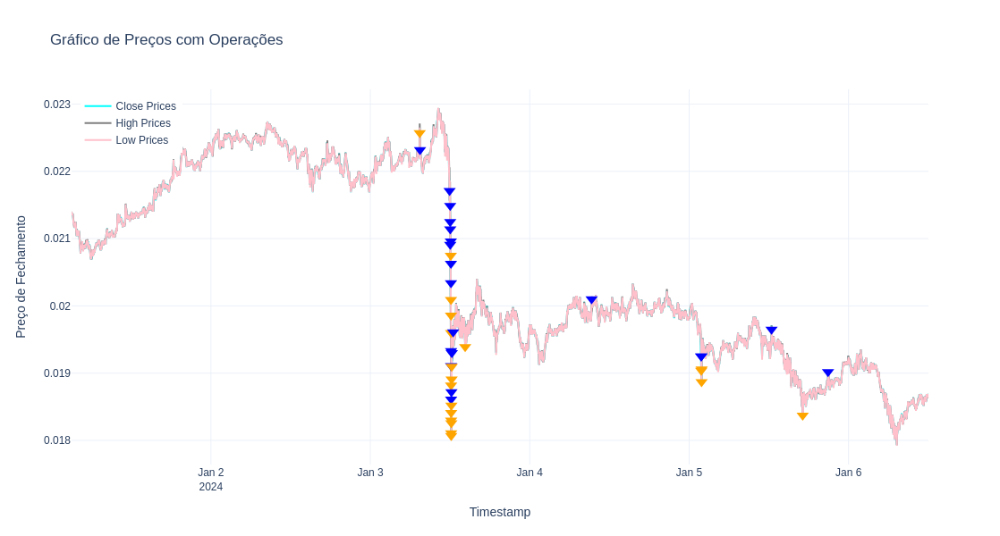

In [31]:
plot_closed_orders_with_icons(closed_orders_df, data, init=0, end=50000)

In [243]:
# VIDTUSDT

# Resumo Geral:
# Total de Ordens Fechadas: 7266
# Total de Ordens Abertas: 0
# Lucro Total (Fechadas): 1722.4999999999977
# Perdas Totais (Fechadas): -1315.4000000000008
# Lucro Líquido (Fechadas): 407.09999999999695
# Ordens Fechadas por TP: 689
# Ordens Fechadas por SL: 6577

In [244]:
import pandas as pd
import plotly.express as px

def plot_cumulative_profit(closed_orders, data=None):
    # Criar DataFrame a partir de closed_orders
    columns = ["Side", "EntryPrice", "ResultPercent", "Reason", "Index", "Opened Index", "reference_price"]

    df = pd.DataFrame(closed_orders, columns=columns)
    
    # Ordenar pelo Index (i) para garantir a cronologia
    df.sort_values(by="Index", inplace=True)
    
    # Calcular a soma acumulada de ResultPercent
    df["CumulativeProfit"] = df["ResultPercent"].cumsum()
    
    # Caso queira associar o 'Index' a datas reais (se data.index for datetime)
    # Se 'data' for um DataFrame com índice datetime, você pode mapear assim:
    # Se desejar utilizar as datas do DataFrame original (caso seja um DF com datetime)
    if data is not None:
        # Supondo que data.index seja datetime e tenha len == número de candles
        # Vamos criar uma coluna Datetime correspondente ao i
        df["Datetime"] = df["Index"].apply(lambda x: data.index[x])
        x_axis_column = "Datetime"
    else:
        x_axis_column = "Index"
    
    # Plot do lucro acumulado com Plotly
    fig = px.line(
        df, 
        x=x_axis_column, 
        y="CumulativeProfit",
        title="Evolução do Lucro Acumulado ao Longo do Tempo",
        labels={
            x_axis_column: "Tempo" if data is not None else "Candle Index",
            "CumulativeProfit": "Lucro Acumulado (%)"
        }
    )
    
    fig.update_layout(
        xaxis_title="Tempo" if data is not None else "Candle Index",
        yaxis_title="Lucro Acumulado (%)",
        hovermode="x unified",
        width=1000, height=1000
    )
    
    fig.show()
    return df


In [246]:
# # Plotar o resultado
# closed_orders_df = plot_cumulative_profit(closed_orders, data=data)

In [247]:
# Carregar os dados
data = load_data_from_mongodb()
data.head()

,_id,timeframe,open,high,low,close,volume,timestamp
0,6770938f405f05735040aa66,2024-01-01 03:00:10,0.02811,0.02811,0.02811,0.02811,201.0,1704078010000
1,6770938f405f05735040aa67,2024-01-01 03:00:34,0.02811,0.02813,0.02811,0.02813,1422.0,1704078034000
2,6770938f405f05735040aa68,2024-01-01 03:00:36,0.02811,0.02811,0.02810,0.02810,1032.0,1704078036000
3,6770938f405f05735040aa69,2024-01-01 03:00:56,0.02810,0.02810,0.02810,0.02810,549.0,1704078056000
4,6770938f405f05735040aa6a,2024-01-01 03:02:04,0.02811,0.02811,0.02811,0.02811,8568.0,1704078124000


In [249]:
# Exemplo de uso
# data = pd.DataFrame({
#     "Close": [100, 101, 102, 103, 98, 95, 110, 90, 105, 100, 97]
# })


res = []
for grid in [0.01,0.02]:
    for time_in_minutes in [0.01]:
        for tp in [0.01,0.015,0.02,0.025,0.03,0.035,0.04]:
            for grid in [0.01,0.02]:
                for sl in [0.004,0.01,0.015,0.02]:
                    print(grid,time_in_minutes,tp,sl)
                    
                    amount_in_usd = 10
                    time_in_minutes = 1
                    
                    # data = pd.read_pickle(f"{symbol}_{granularity}.pkl")
                    data_filtered = data[data['timeframe'] >= '2023-01-01 00:00:00']
                    
                    closed_orders, open_orders, open_positions_history = simulate_strategy(data_filtered, tp, sl, movimentation, grid, time_in_minutes)
                    dataa = {
                        "movimentation":movimentation,'time_in_minutes':time_in_minutes,"tp":tp,"sl":sl,"grid":grid,"closed_orders":closed_orders
                    }
                    res.append(dataa)

0.01 0.01 0.01 0.004
0.01 1 0.01 0.01
0.01 1 0.01 0.015
0.01 1 0.01 0.02
0.02 1 0.01 0.004
0.02 1 0.01 0.01
0.02 1 0.01 0.015
0.02 1 0.01 0.02
0.01 1 0.015 0.004
0.01 1 0.015 0.01
0.01 1 0.015 0.015
0.01 1 0.015 0.02
0.02 1 0.015 0.004
0.02 1 0.015 0.01
0.02 1 0.015 0.015
0.02 1 0.015 0.02
0.01 1 0.02 0.004
0.01 1 0.02 0.01
0.01 1 0.02 0.015
0.01 1 0.02 0.02
0.02 1 0.02 0.004
0.02 1 0.02 0.01
0.02 1 0.02 0.015
0.02 1 0.02 0.02
0.01 1 0.025 0.004
0.01 1 0.025 0.01
0.01 1 0.025 0.015
0.01 1 0.025 0.02
0.02 1 0.025 0.004
0.02 1 0.025 0.01
0.02 1 0.025 0.015
0.02 1 0.025 0.02
0.01 1 0.03 0.004
0.01 1 0.03 0.01
0.01 1 0.03 0.015
0.01 1 0.03 0.02
0.02 1 0.03 0.004
0.02 1 0.03 0.01
0.02 1 0.03 0.015
0.02 1 0.03 0.02
0.01 1 0.035 0.004
0.01 1 0.035 0.01
0.01 1 0.035 0.015
0.01 1 0.035 0.02
0.02 1 0.035 0.004
0.02 1 0.035 0.01
0.02 1 0.035 0.015
0.02 1 0.035 0.02
0.01 1 0.04 0.004
0.01 1 0.04 0.01
0.01 1 0.04 0.015
0.01 1 0.04 0.02
0.02 1 0.04 0.004
0.02 1 0.04 0.01
0.02 1 0.04 0.015
0.02 1 0.0

In [252]:
best = -9999
best_fees = -9999
best_fees_ = {}
best_ = {}
for i in res:
    closed_orders_df = pd.DataFrame(closed_orders, columns=["Lado", "Preço Entrada", "Resultado", "Motivo", "Index", "Opened Index", "Sl", "Tp"])
 
    # Cálculo do resumo geral
    total_closed = len(i['closed_orders'])  # Total de ordens fechadas
    total_profit = closed_orders_df[closed_orders_df["Resultado"] > 0]["Resultado"].sum()  # Total de lucros
    total_loss = closed_orders_df[closed_orders_df["Resultado"] < 0]["Resultado"].sum()  # Total de perdas
    net_profit = total_profit + total_loss  # Lucro líquido

    # Contagem de motivos
    tp_count = (closed_orders_df["Motivo"] == "TP").sum()
    sl_count = (closed_orders_df["Motivo"] == "SL").sum()
    
    net_with_fees = net_profit-(total_closed*0.1)
    
    if net_with_fees > best_fees:
        best_fees = net_with_fees
        best_fees_ = {
            "movimentation":i['movimentation'],
            "tp":i['tp'],
            "sl":i['sl'],
            "grid":i['grid'],
            "total_closed":total_closed,
            "total_profit":total_profit,
            "total_loss":total_loss,
            "net_profit":net_profit,
            "net_with_fees":net_with_fees,
            "tp_count":int(tp_count),
            "sl_count":int(sl_count)
        }

    if net_profit > best:
        best = net_profit
        best_ = {
            "movimentation":i['movimentation'],
            "tp":i['tp'],
            "sl":i['sl'],
            "grid":i['grid'],
            "total_closed":total_closed,
            "total_profit":total_profit,
            "total_loss":total_loss,
            "net_profit":net_profit,
            "net_with_fees":net_with_fees,
            "tp_count":int(tp_count),
            "sl_count":int(sl_count)
        }

In [253]:
best_

{'movimentation': 0.01,
 'tp': 0.01,
 'sl': 0.004,
 'grid': 0.01,
 'total_closed': 4941,
 'total_profit': np.float64(780.0000000000007),
 'total_loss': np.float64(-674.0000000000006),
 'net_profit': np.float64(106.00000000000011),
 'net_with_fees': np.float64(-388.0999999999999),
 'tp_count': 195,
 'sl_count': 337}

In [254]:
best_fees_

{'movimentation': 0.01,
 'tp': 0.04,
 'sl': 0.02,
 'grid': 0.02,
 'total_closed': 532,
 'total_profit': np.float64(780.0000000000007),
 'total_loss': np.float64(-674.0000000000006),
 'net_profit': np.float64(106.00000000000011),
 'net_with_fees': np.float64(52.80000000000011),
 'tp_count': 195,
 'sl_count': 337}